In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import xgboost as xgb
import seaborn as sns
from sklearn.metrics import roc_curve, auc
from sklearn.model_selection import StratifiedKFold
from sklearn.inspection import PartialDependenceDisplay

In [2]:
# Read the dataset
formatted_data = pd.read_csv('formatted_data.csv', sep=";")
formatted_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4424 entries, 0 to 4423
Data columns (total 37 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   Marital_status                                4424 non-null   int64  
 1   Application_mode                              4424 non-null   int64  
 2   Application_order                             4424 non-null   int64  
 3   Course                                        4424 non-null   int64  
 4   Daytime_evening_attendance                    4424 non-null   int64  
 5   Previous_qualification                        4424 non-null   int64  
 6   Previous_qualification_grade                  4424 non-null   float64
 7   Nacionality                                   4424 non-null   int64  
 8   Mothers_qualification                         4424 non-null   int64  
 9   Fathers_qualification                         4424 non-null   i

Text(0.5, 0.98, 'Correlation matrix of the numerical columns')

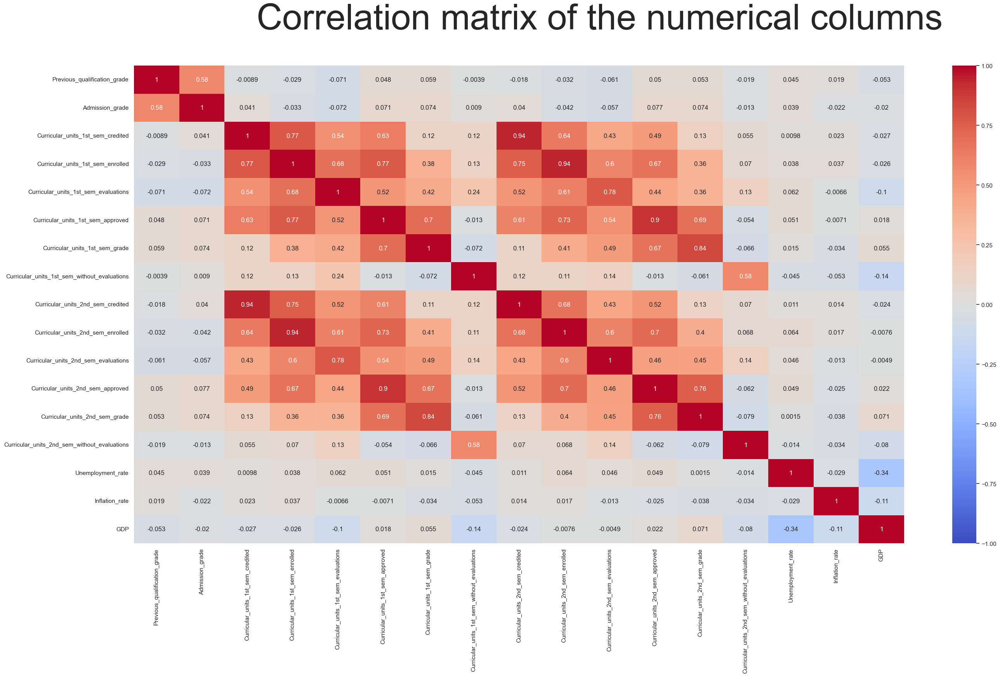

In [3]:
numeric_cols = formatted_data.iloc[:,[6,12,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35]]
# Correlation Matrix of Numeric Features 
sns.set_theme(rc = {'figure.figsize':(32,16)})
sns.heatmap(numeric_cols.corr(), annot=True, fmt='.2g', cmap='coolwarm',vmax=1,vmin=-1)
plt.suptitle('Correlation matrix of the numerical columns', fontsize=66)

## Remove correlated columns for sem 2

Text(0.5, 0.98, 'Correlation matrix of the numerical columns')

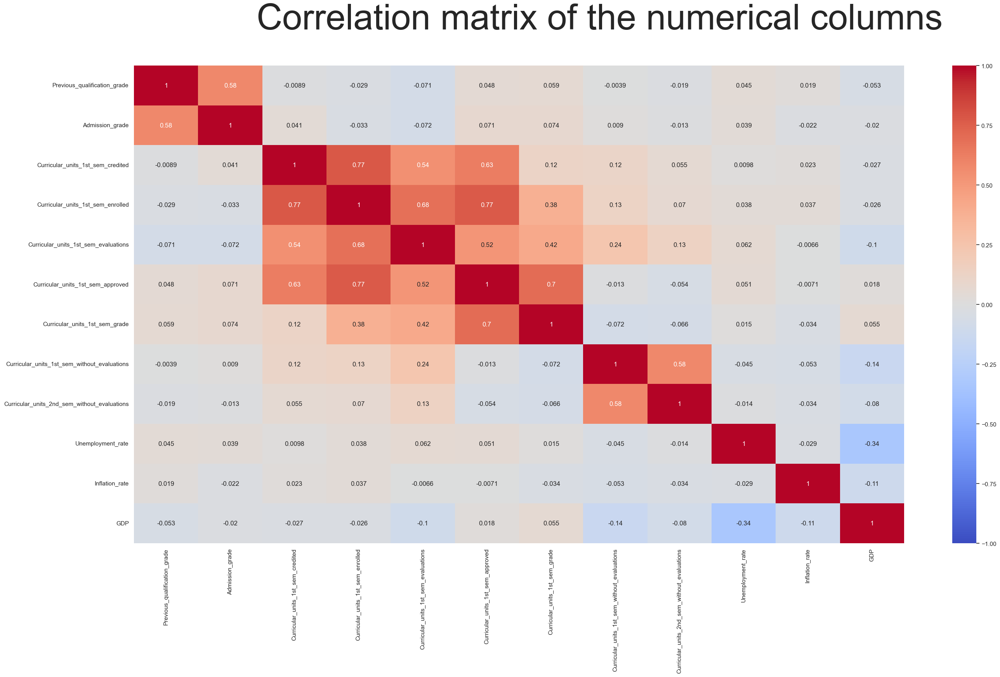

In [4]:
columns_to_remove = [
    'Curricular_units_2nd_sem_credited', 
    'Curricular_units_2nd_sem_enrolled',
    'Curricular_units_2nd_sem_evaluations', 
    'Curricular_units_2nd_sem_approved',
    'Curricular_units_2nd_sem_grade'
]

pdp_data = formatted_data.drop(columns=columns_to_remove)

features = pdp_data.drop(columns=['Target'])
target = pdp_data['Target']

numeric_cols_pdp = formatted_data.iloc[:,[6,12,21,22,23,24,25,26,32,33,34,35]]
# Correlation Matrix of Numeric Features 
sns.set_theme(rc = {'figure.figsize':(32,16)})
sns.heatmap(numeric_cols_pdp.corr(), annot=True, fmt='.2g', cmap='coolwarm',vmax=1,vmin=-1)
plt.suptitle('Correlation matrix of the numerical columns', fontsize=66)

In [5]:
RANDOM_SEED = 42
k = 5
cv = StratifiedKFold(n_splits=k, random_state=RANDOM_SEED, shuffle=True)

In [6]:
def plot_roc_curve(fprs, tprs, figsize=(5, 5)):
    mean_fpr = np.linspace(0, 1, 100)
    fig, ax = plt.subplots(figsize=figsize)

    for i, (fpr, tpr) in enumerate(zip(fprs, tprs)):
        roc_auc = auc(fpr, tpr)
        ax.plot(fpr, tpr, lw=1, alpha=0.3,
                label='ROC fold %d (AUC = %0.2f)' % (i, roc_auc))

    ax.plot([0, 1], [0, 1], linestyle='--', lw=2, color='r',
            label='Luck', alpha=.8)

    mean_tpr = np.mean([np.interp(mean_fpr, fpr, tpr) for fpr, tpr in zip(fprs, tprs)], axis=0)
    mean_auc = auc(mean_fpr, mean_tpr)
    std_auc = np.std([auc(fpr, tpr) for fpr, tpr in zip(fprs, tprs)])
    ax.plot(mean_fpr, mean_tpr, color='b',
            label=r'Mean ROC (AUC = %0.2f $\pm$ %0.2f)' % (mean_auc, std_auc),
            lw=2, alpha=.8)

    std_tpr = np.std([np.interp(mean_fpr, fpr, tpr) for fpr, tpr in zip(fprs, tprs)], axis=0)
    tprs_upper = np.minimum(mean_tpr + std_tpr, 1)
    tprs_lower = np.maximum(mean_tpr - std_tpr, 0)
    ax.fill_between(mean_fpr, tprs_lower, tprs_upper, color='grey', alpha=.2,
                    label=r'$\pm$ 1 std. dev.')

    ax.set_xlim([-0.05, 1.05])
    ax.set_ylim([-0.05, 1.05])
    ax.set_xlabel('False Positive Rate')
    ax.set_ylabel('True Positive Rate')
    ax.set_title('Receiver operating characteristic')
    ax.legend(loc="lower right")
    plt.show()
    return fig, ax

def compute_roc_auc(clf, X, y, index):
    y_predict = clf.predict_proba(X.iloc[index])[:, 1]
    fpr, tpr, thresholds = roc_curve(y.iloc[index], y_predict)
    auc_score = auc(fpr, tpr)
    return fpr, tpr, auc_score

def train_and_show_auc(clf, X, y):
    fprs, tprs, scores = [], [], []

    for (train, test), i in zip(cv.split(X, y), range(5)):
        clf.fit(X.iloc[train], y.iloc[train])
        _, _, auc_score_train = compute_roc_auc(clf, X, y, train)
        fpr, tpr, auc_score = compute_roc_auc(clf, X, y, test)
        scores.append((auc_score_train, auc_score))
        fprs.append(fpr)
        tprs.append(tpr)

    plot_roc_curve(fprs, tprs)
    return clf, pd.DataFrame(scores, columns=['AUC Train', 'AUC Test'])

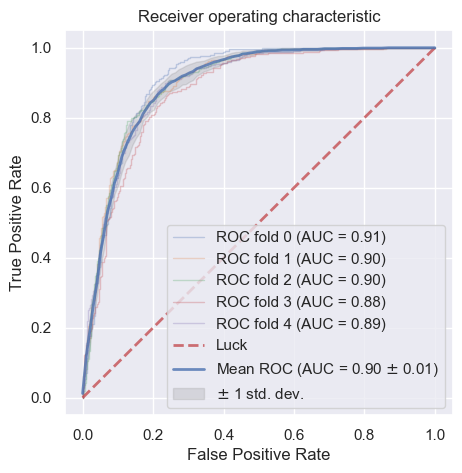

In [7]:
xgb_classifier = xgb.XGBClassifier(random_state=RANDOM_SEED)
xgb_trained, xgb_scores = train_and_show_auc(xgb_classifier, features, target)

## PDP and ICE

In [8]:
# Get feature importances from the trained model
feature_importances = xgb_trained.get_booster().get_score(importance_type='weight')
sorted_features = sorted(feature_importances, key=feature_importances.get, reverse=True)

In [9]:
feature_names = features.columns.tolist()
sorted_features_indices = [(feature, feature_names.index(feature), sorted_features.index(feature)) for feature in sorted_features]
for feature, original_index, sorted_index in sorted_features_indices:
    print(f"{sorted_index},  {feature}, Original Index: {original_index}")


0,  Admission_grade, Original Index: 12
1,  Curricular_units_1st_sem_grade, Original Index: 25
2,  Previous_qualification_grade, Original Index: 6
3,  Course, Original Index: 3
4,  Curricular_units_1st_sem_approved, Original Index: 24
5,  Curricular_units_1st_sem_evaluations, Original Index: 23
6,  Age_at_enrollment, Original Index: 19
7,  Fathers_occupation, Original Index: 11
8,  Unemployment_rate, Original Index: 28
9,  Mothers_occupation, Original Index: 10
10,  Fathers_qualification, Original Index: 9
11,  Mothers_qualification, Original Index: 8
12,  Application_mode, Original Index: 1
13,  GDP, Original Index: 30
14,  Inflation_rate, Original Index: 29
15,  Curricular_units_1st_sem_enrolled, Original Index: 22
16,  Application_order, Original Index: 2
17,  Gender, Original Index: 17
18,  Displaced, Original Index: 13
19,  Scholarship_holder, Original Index: 18
20,  Tuition_fees_up_to_date, Original Index: 16
21,  Curricular_units_1st_sem_credited, Original Index: 21
22,  Previou

## Example of PDP
- 1 feature

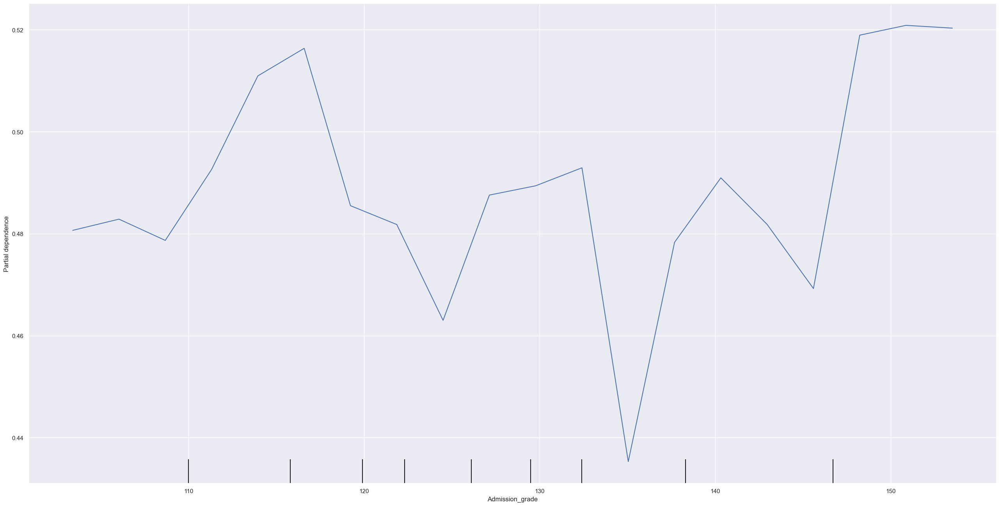

In [10]:
feature = 'Admission_grade'
# feature = 'Curricular_units_1st_sem_approved'

PartialDependenceDisplay.from_estimator(
    estimator=xgb_trained,
    X=features,
    features=[feature],
    kind='average',
    # kind='both'
    grid_resolution=20,
)

- 2 features

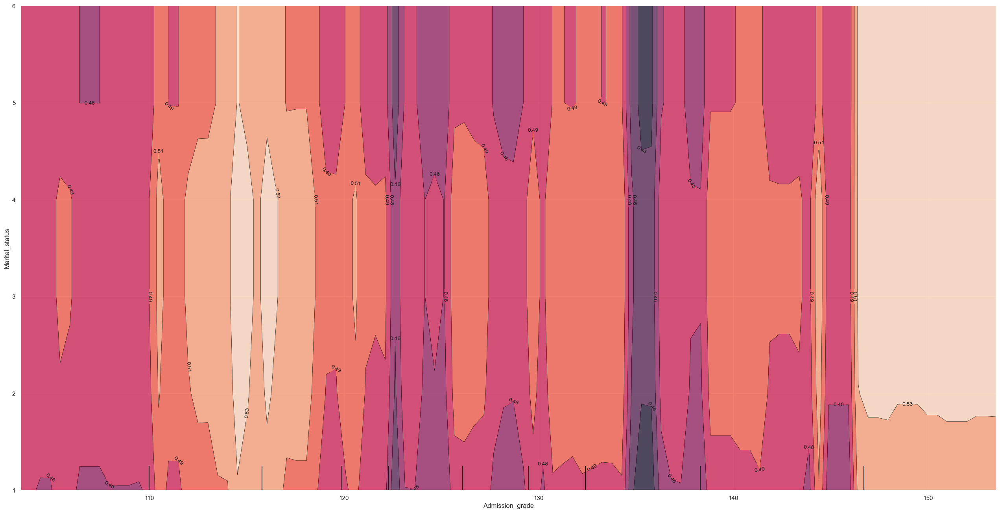

In [16]:
# Most important feature and the second most important for interaction
two_important_features = [sorted_features[0], sorted_features[1]]
PartialDependenceDisplay.from_estimator(
    estimator=xgb_trained, 
    X=features, 
    features=[(features.columns.get_loc(sorted_features[0]), features.columns.get_loc(sorted_features[26]))], 
    kind='average'
)

## Example of ICE

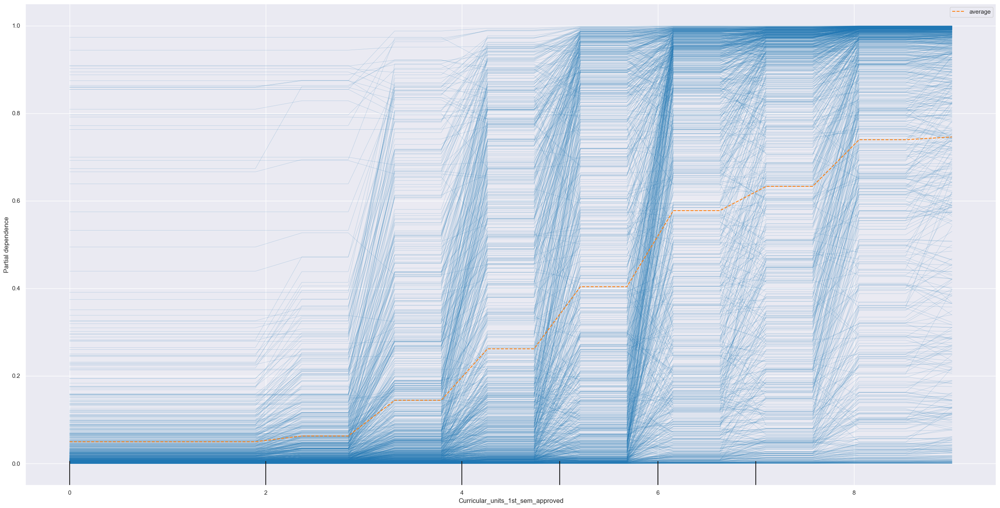

In [12]:
PartialDependenceDisplay.from_estimator(
    estimator=xgb_trained,
    X=features,
    features=[sorted_features[4]],
    kind='both',
    grid_resolution=20
)

## All PDP's
The importance is different because the feature importances from XGBoost generally reflect the overall contribution of each feature to the model across all trees. This includes how often a feature is used to split across all trees and the improvement to the model's accuracy when it is used

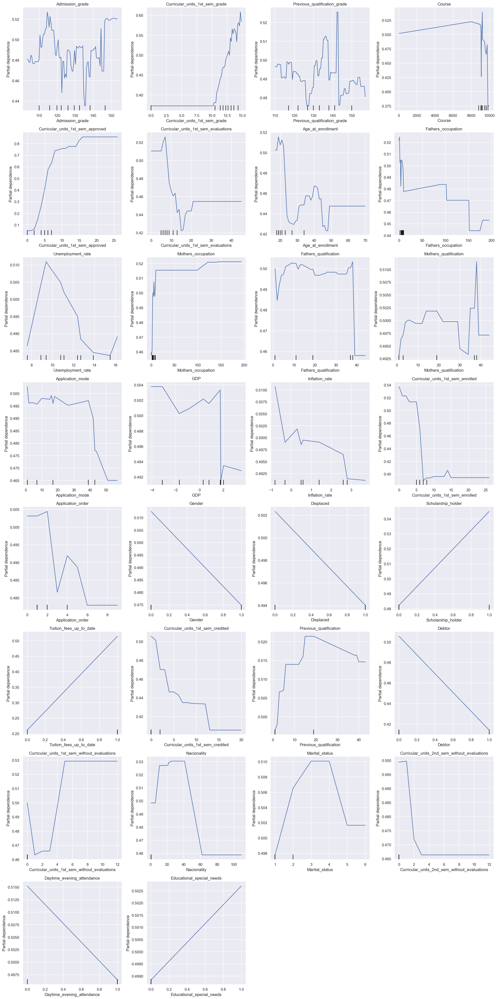

In [13]:
n_features = len(sorted_features)
n_cols = 4
n_rows = n_features // n_cols + (n_features % n_cols > 0)
# Create subplots
fig, axs = plt.subplots(n_rows, n_cols, figsize=(5*n_cols, 5*n_rows))
axs = axs.flatten()

# Plot PDP for each feature
for i, feature in enumerate(sorted_features):
    ax = axs[i]
    PartialDependenceDisplay.from_estimator(
        estimator=xgb_trained,
        X=features,
        features=[feature],
        kind='average',
        ax=ax
    )
    ax.set_title(feature)

# Hide any remaining subplots that aren't used
for ax in axs[n_features:]:
    ax.remove()

plt.tight_layout()
plt.show()


## All ICE's

c:\Users\simut\anaconda3\envs\me_env\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


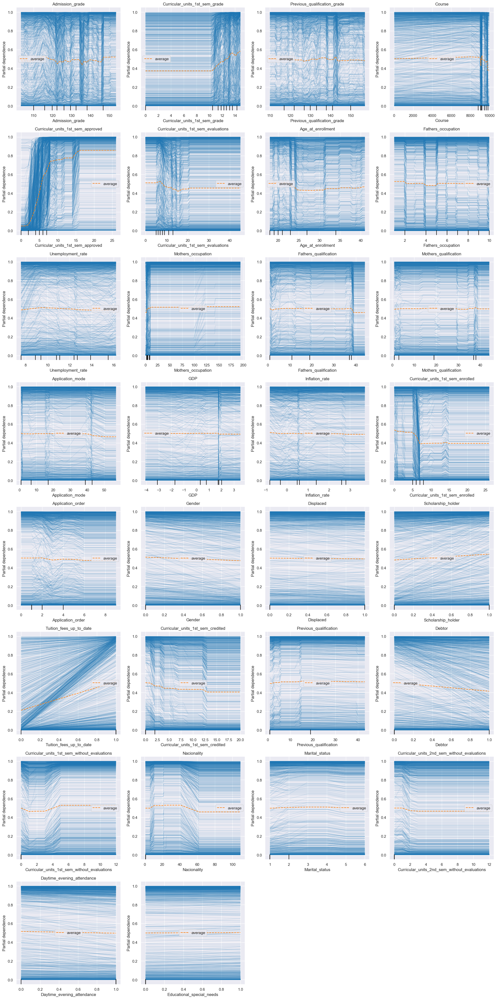

In [14]:
n_cols = 4
n_rows = len(sorted_features) // n_cols + (len(sorted_features) % n_cols > 0)

# Create a figure with subplots
fig, axs = plt.subplots(n_rows, n_cols, figsize=(20, 5 * n_rows))
axs = axs.flatten()

for i, feature in enumerate(sorted_features):
    if i < len(axs):
        PartialDependenceDisplay.from_estimator(
            estimator=xgb_trained,
            X=features,
            features=[feature],
            kind='both',
            ax=axs[i],
            grid_resolution=40,
            n_jobs=-1
        )
        axs[i].set_title(feature)
    else:
        break

# Hide any remaining axes if there are less features than subplots
for j in range(i, len(axs)):
    axs[j].set_visible(False)

plt.tight_layout()
plt.show()
